# Multi task CNN for gender, age and ethnicity classification



**Author** : Utpalraj Kemprai

## Importing libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import numpy as np
import pandas as pd
import os
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt

## Downloading the Fairface dataset

In [2]:
# download dataset and unzip
!kaggle datasets download mehmoodsheikh/fairface-dataset
!unzip fairface-dataset.zip -d fairface

Dataset URL: https://www.kaggle.com/datasets/mehmoodsheikh/fairface-dataset
License(s): MIT
 99%|████████████████████████████████████████▌| 544M/550M [00:02<00:00, 299MB/s]
100%|█████████████████████████████████████████| 550M/550M [00:02<00:00, 260MB/s]
Archive:  fairface-dataset.zip
  inflating: fairface/FairFace/fairface_label_train.csv  
  inflating: fairface/FairFace/fairface_label_val.csv  
  inflating: fairface/FairFace/train/1.jpg  
  inflating: fairface/FairFace/train/10.jpg  
  inflating: fairface/FairFace/train/100.jpg  
  inflating: fairface/FairFace/train/1000.jpg  
  inflating: fairface/FairFace/train/10000.jpg  
  inflating: fairface/FairFace/train/10001.jpg  
  inflating: fairface/FairFace/train/10002.jpg  
  inflating: fairface/FairFace/train/10003.jpg  
  inflating: fairface/FairFace/train/10004.jpg  
  inflating: fairface/FairFace/train/10005.jpg  
  inflating: fairface/FairFace/train/10006.jpg  
  inflating: fairface/FairFace/train/10007.jpg  
  inflating: fairface/F

## View the dataset

### Train data

In [3]:
label_train_data = pd.read_csv('/kaggle/working/fairface/FairFace/fairface_label_train.csv')
label_train_data.head()

,file,age,gender,race,service_test
0,train/1.jpg,50-59,Male,East Asian,True
1,train/2.jpg,30-39,Female,Indian,False
2,train/3.jpg,3-9,Female,Black,False
3,train/4.jpg,20-29,Female,Indian,True
4,train/5.jpg,20-29,Female,Indian,True


In [4]:
label_train_data['age'].unique()

array(['50-59', '30-39', '3-9', '20-29', '40-49', '10-19', '60-69', '0-2',
       'more than 70'], dtype=object)

<Axes: xlabel='age'>

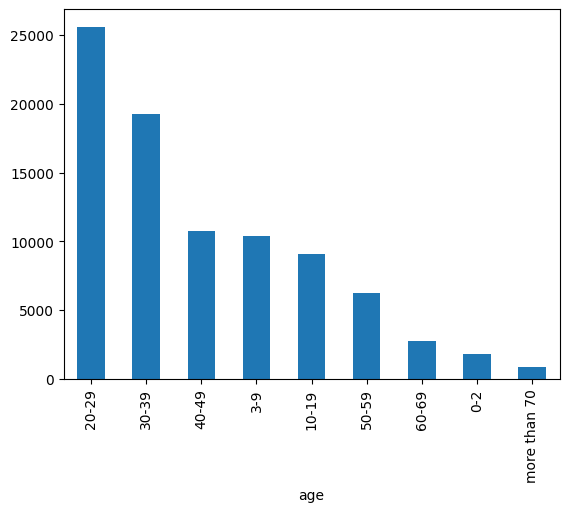

In [48]:
# plot the bar graph for age
label_train_data['age'].value_counts().plot(kind='bar')

In [49]:
label_train_data['gender'].unique()

array(['Male', 'Female'], dtype=object)

<Axes: xlabel='gender'>

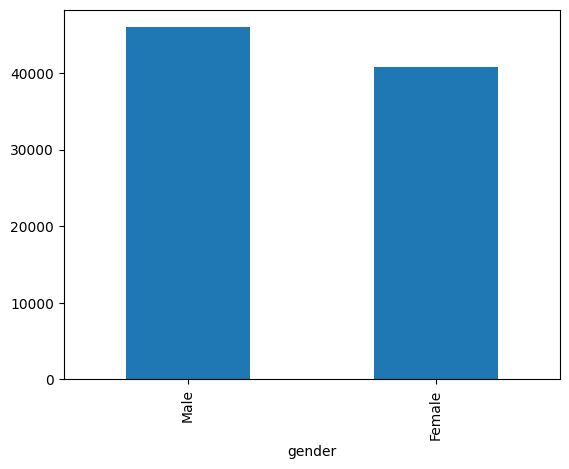

In [50]:
# plot the bar graph for gender

label_train_data['gender'].value_counts().plot(kind='bar')

In [51]:
label_train_data['race'].unique()

array(['East Asian', 'Indian', 'Black', 'White', 'Middle Eastern',
       'Latino_Hispanic', 'Southeast Asian'], dtype=object)

<Axes: xlabel='race'>

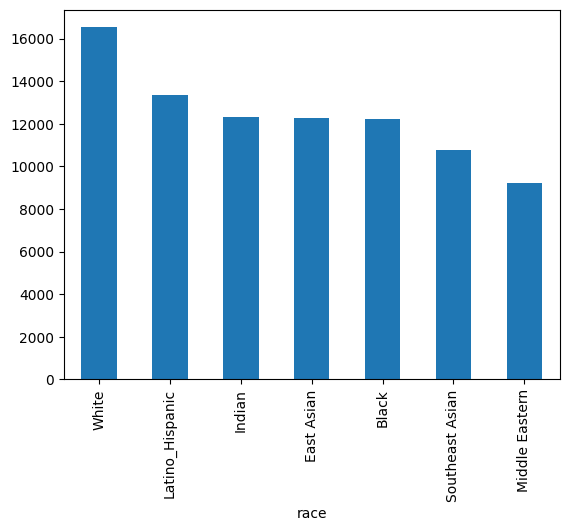

In [52]:
# plot the bar graph for race
label_train_data['race'].value_counts().plot(kind='bar')

In [53]:
label_train_data.isna().mean()

file            0.0
age             0.0
gender          0.0
race            0.0
service_test    0.0
dtype: float64

### Validation data

In [54]:
label_val_data = pd.read_csv('/kaggle/working/fairface/FairFace/fairface_label_val.csv')
label_val_data.head()

,file,age,gender,race,service_test
0,val/1.jpg,3-9,Male,East Asian,False
1,val/2.jpg,50-59,Female,East Asian,True
2,val/3.jpg,30-39,Male,White,True
3,val/4.jpg,20-29,Female,Latino_Hispanic,True
4,val/5.jpg,20-29,Male,Southeast Asian,False


<Axes: xlabel='age'>

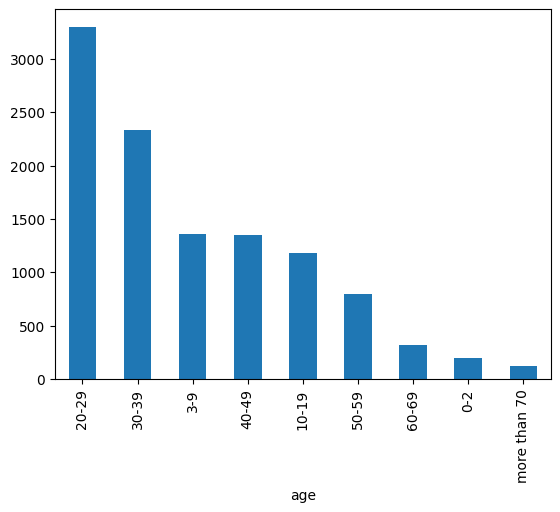

In [55]:
# plot the bar graph for age
label_val_data['age'].value_counts().plot(kind='bar')

<Axes: xlabel='gender'>

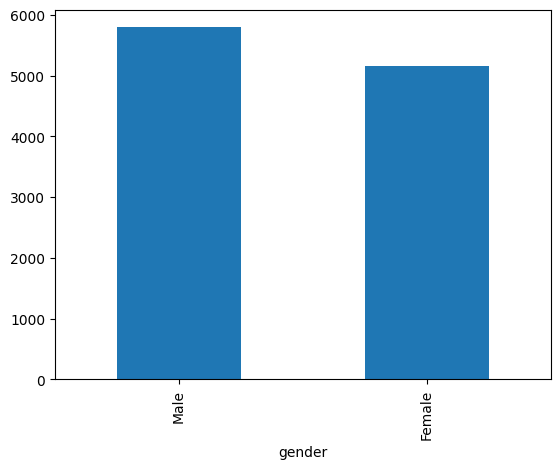

In [56]:
# plot the bar graph for age
label_val_data['gender'].value_counts().plot(kind='bar')

<Axes: xlabel='race'>

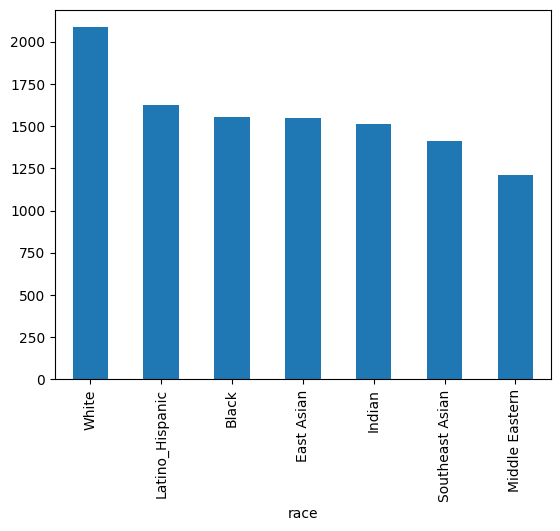

In [57]:
# plot the bar graph for age
label_val_data['race'].value_counts().plot(kind='bar')

In [58]:
label_val_data.isna().mean()

file            0.0
age             0.0
gender          0.0
race            0.0
service_test    0.0
dtype: float64

## Process the data for training and validation

In [59]:
class FairFaceMultiTaskDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.annotations = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

        # Define mappings for age and ethnicity
        self.age_mapping = {'0-2': 0, '3-9': 1, '10-19': 2, '20-29': 3, '30-39': 4, '40-49': 5, '50-59': 6, '60-69': 7, 'more than 70': 8}
        self.ethnicity_mapping = {'White': 0, 'Black': 1, 'Latino_Hispanic': 2, 'East Asian': 3, 'Southeast Asian': 4, 'Indian': 5, 'Middle Eastern': 6}

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.annotations.iloc[idx, 0])
        image = Image.open(img_path).convert("RGB")

        # Extract labels for gender, age, and ethnicity
        gender_label = 0 if self.annotations.iloc[idx, 2] == 'Male' else 1
        age_label = self.age_mapping[self.annotations.iloc[idx, 1]]
        ethnicity_label = self.ethnicity_mapping[self.annotations.iloc[idx, 3]]

        if self.transform:
            image = self.transform(image)

        return image, (gender_label, age_label, ethnicity_label)

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load dataset
train_dataset = FairFaceMultiTaskDataset(csv_file='fairface/FairFace/fairface_label_train.csv', root_dir='fairface/FairFace', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataset =  FairFaceMultiTaskDataset(csv_file='fairface/FairFace/fairface_label_val.csv', root_dir='fairface/FairFace', transform=transform)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

## Define the CNN model

In [60]:
# Alternative more complex model
class DepthwiseSeparableConv(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super(DepthwiseSeparableConv, self).__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=stride, padding=1, groups=in_channels, bias=False)
        self.pointwise = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)
        x = self.bn(x)
        return self.relu(x)

class LightweightMTLNet224(nn.Module):
    def __init__(self, num_classes_gender=2, num_classes_age=5, num_classes_ethnicity=7):
        super(LightweightMTLNet224, self).__init__()
        
        # Input layer
        self.conv1 = DepthwiseSeparableConv(3, 32, stride=2)  # Output: 112x112
        self.conv2 = DepthwiseSeparableConv(32, 64, stride=2)  # Output: 56x56
        self.conv3 = DepthwiseSeparableConv(64, 128, stride=2) # Output: 28x28
        self.conv4 = DepthwiseSeparableConv(128, 256, stride=2) # Output: 14x14
        self.conv5 = DepthwiseSeparableConv(256, 512, stride=2) # Output: 7x7
        
        # Pooling layer to reduce size to 1x1
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        
        # Task-specific classifiers
        self.gender_fc = nn.Linear(512, num_classes_gender)
        self.age_fc = nn.Linear(512, num_classes_age)
        self.ethnicity_fc = nn.Linear(512, num_classes_ethnicity)

    def forward(self, x):
        # Pass through the convolutional layers
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        
        # Global average pooling
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        
        # Multi-task outputs
        gender = self.gender_fc(x)
        age = self.age_fc(x)
        ethnicity = self.ethnicity_fc(x)
        return gender, age, ethnicity


In [ ]:
# class CNN(nn.Module):
#     def __init__(self, input_size, num_age_classes, num_ethnicity_classes ):
#         super(CNN, self).__init__()
#         self.conv1 = nn.Conv2d(in_channels=3, out_channels=12, kernel_size=3,padding=0)
#         self.conv2 = nn.Conv2d(in_channels=12, out_channels=24, kernel_size=6,padding=0)
#         self.conv3 = nn.Conv2d(in_channels=24, out_channels=32, kernel_size=6,padding=0)
#         self.fc1 = nn.Linear(8*4*4, 200)
#         self.fc2 = nn.Linear(200, 10)

#         # Task-specific output layers
#         self.gender_fc = nn.Linear(10, 2)              # Output for gender classification (2 classes)
#         self.age_fc = nn.Linear(10, num_age_classes)   # Output for age classification
#         self.ethnicity_fc = nn.Linear(10, num_ethnicity_classes)  # Output for ethnicity classification

#     def forward(self, x, verbose=False):
#         x = self.conv1(x)
#         x = F.relu(x)
#         x = self.conv2(x)
#         x = F.relu(x)
#         x = F.max_pool2d(x, kernel_size=2)
#         x = self.conv3(x)
#         x = F.relu(x)
#         x = F.max_pool2d(x, kernel_size=2)
#         x = x.view(-1, 8*4*4)
#         x = self.fc1(x)
#         x = F.relu(x)
#         x = self.fc2(x)

#         # Task-specific outputs
#         gender_output = self.gender_fc(x)
#         age_output = self.age_fc(x)
#         ethnicity_output = self.ethnicity_fc(x)

#         return gender_output, age_output, ethnicity_output

In [61]:
# Define number of classes for each task
num_age_classes = 9         # Example: 9 age ranges (adjust as per your data)
num_ethnicity_classes = 7   # Example: 7 ethnicity classes

# Initialize model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


### Initialize the model

In [62]:
# Instantiate and check the number of trainable parameters
# model = CNN(28*28,num_age_classes,num_ethnicity_classes).to(device)
model = LightweightMTLNet224(2, num_age_classes, num_ethnicity_classes).to(device)
print(f"Number of trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)}")

Number of trainable parameters: 189741


In [63]:
print(model)

LightweightMTLNet224(
  (conv1): DepthwiseSeparableConv(
    (depthwise): Conv2d(3, 3, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=3, bias=False)
    (pointwise): Conv2d(3, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
  )
  (conv2): DepthwiseSeparableConv(
    (depthwise): Conv2d(32, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=32, bias=False)
    (pointwise): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
  )
  (conv3): DepthwiseSeparableConv(
    (depthwise): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=64, bias=False)
    (pointwise): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_

### Loss functions and optimizer

In [64]:
# Loss functions for each output
gender_criterion = nn.CrossEntropyLoss()
age_criterion = nn.CrossEntropyLoss()
ethnicity_criterion = nn.CrossEntropyLoss()

# Optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

### Function for model evaluation

In [65]:
def evaluate(model, val_loader):
    model.eval()
    gender_correct, age_correct, ethnicity_correct = 0, 0, 0
    total = 0

    with torch.no_grad():
        for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:
            images = images.to(device)
            gender_labels = gender_labels.to(device)
            age_labels = age_labels.to(device)
            ethnicity_labels = ethnicity_labels.to(device)

            gender_output, age_output, ethnicity_output = model(images)

            # Calculate accuracy for each task
            gender_correct += (gender_output.argmax(1) == gender_labels).sum().item()
            age_correct += (age_output.argmax(1) == age_labels).sum().item()
            ethnicity_correct += (ethnicity_output.argmax(1) == ethnicity_labels).sum().item()

            total += gender_labels.size(0)

    print(f"Gender Accuracy: {100 * gender_correct / total:.2f}%")
    print(f"Age Accuracy: {100 * age_correct / total:.2f}%")
    print(f"Ethnicity Accuracy: {100 * ethnicity_correct / total:.2f}%")

In [66]:
len(train_dataset)

86744

In [67]:
len(val_dataset)

10954

## Training the model and evaluation

In [68]:
num_epochs = 20
losses = []
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    batch_idx = 1
    for images, (gender_labels, age_labels, ethnicity_labels) in train_loader:
        images = images.to(device)
        gender_labels = gender_labels.to(device)
        age_labels = age_labels.to(device)
        ethnicity_labels = ethnicity_labels.to(device)

        optimizer.zero_grad()
        
        # Forward pass
        gender_output, age_output, ethnicity_output = model(images)

        # Compute individual losses and combine them
        gender_loss = gender_criterion(gender_output, gender_labels)
        age_loss = age_criterion(age_output, age_labels)
        ethnicity_loss = ethnicity_criterion(ethnicity_output, ethnicity_labels)

        total_loss = (gender_loss + age_loss + ethnicity_loss)/3
        total_loss.backward()
        optimizer.step()

        if batch_idx % 200 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch+1, batch_idx * len(gender_labels), len(train_dataset),
                100. * batch_idx / len(train_loader), total_loss.item()))

        batch_idx += 1
        running_loss += total_loss.item()
    losses.append(running_loss/len(train_loader))

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}")
    evaluate(model, val_loader)

Train Epoch: 1 [6400/86744 (7%)]	Loss: 1.505775
Train Epoch: 1 [12800/86744 (15%)]	Loss: 1.363495
Train Epoch: 1 [19200/86744 (22%)]	Loss: 1.466708
Train Epoch: 1 [25600/86744 (30%)]	Loss: 1.436202
Train Epoch: 1 [32000/86744 (37%)]	Loss: 1.340875
Train Epoch: 1 [38400/86744 (44%)]	Loss: 1.296775
Train Epoch: 1 [44800/86744 (52%)]	Loss: 1.444286
Train Epoch: 1 [51200/86744 (59%)]	Loss: 1.313578
Train Epoch: 1 [57600/86744 (66%)]	Loss: 1.271955
Train Epoch: 1 [64000/86744 (74%)]	Loss: 1.116240
Train Epoch: 1 [70400/86744 (81%)]	Loss: 1.066276
Train Epoch: 1 [76800/86744 (89%)]	Loss: 1.171839
Train Epoch: 1 [83200/86744 (96%)]	Loss: 1.150226
Epoch [1/20], Loss: 1.3205
Gender Accuracy: 77.09%
Age Accuracy: 38.64%
Ethnicity Accuracy: 41.25%
Train Epoch: 2 [6400/86744 (7%)]	Loss: 1.125729
Train Epoch: 2 [12800/86744 (15%)]	Loss: 1.241905
Train Epoch: 2 [19200/86744 (22%)]	Loss: 1.242898
Train Epoch: 2 [25600/86744 (30%)]	Loss: 1.099685
Train Epoch: 2 [32000/86744 (37%)]	Loss: 1.081122
Train

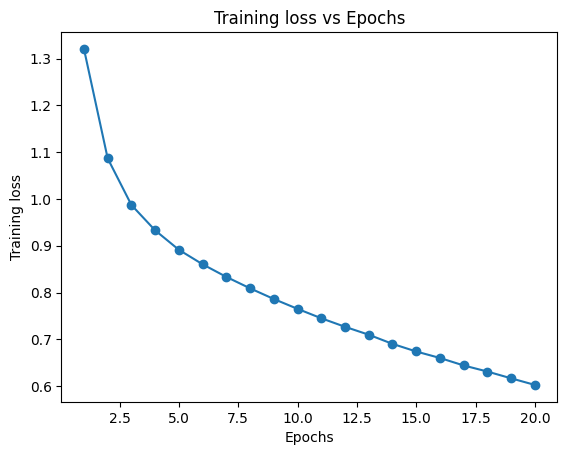

In [69]:
# plot the losses vs the number of epochs
epochs = list(range(1, len(losses)+1))
plt.plot(epochs,losses,marker = 'o')
plt.xlabel("Epochs")
plt.ylabel("Training loss")
plt.title("Training loss vs Epochs")
plt.show()

In [70]:
# Run evaluation
evaluate(model, val_loader)

Gender Accuracy: 84.78%
Age Accuracy: 45.67%
Ethnicity Accuracy: 54.87%


## Saving the model

In [71]:
# Save the model state dictionary
model_path = 'multi_task_model.pth'
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")

Model saved to multi_task_model.pth


## visualizing the output for some sample images

In [72]:
def predict_proba(model, image_path, transform, device):
    """
    Predicts the probability distribution for gender, age, and ethnicity.

    Args:
        model: The trained multi-task model.
        image_path: Path to the input image.
        transform: Image transformations.
        device: Device to run the model on.

    Returns:
        A dictionary containing the image and probability distributions for gender, age, and ethnicity.
    """

    model.eval()
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        gender_output, age_output, ethnicity_output = model(image)

    # Convert outputs to probability distributions
    gender_proba = torch.softmax(gender_output, dim=1).cpu().numpy()[0]
    age_proba = torch.softmax(age_output, dim=1).cpu().numpy()[0]
    ethnicity_proba = torch.softmax(ethnicity_output, dim=1).cpu().numpy()[0]

    return {
        'image': image_path,
        'gender_proba': gender_proba,
        'age_proba': age_proba,
        'ethnicity_proba': ethnicity_proba
    }

In [73]:
def plot_results(prediction_result):

    """Plots the image, gender, age, and ethnicity probabilities in a single row."""
    fig, axes = plt.subplots(1, 4, figsize=(18, 5))

    # Plot the image
    image = Image.open(prediction_result['image']).convert("RGB")
    axes[0].imshow(image)
    axes[0].set_title("Image")
    axes[0].axis('off')

    # Plot gender probability
    labels = ['Male', 'Female']
    axes[1].bar(labels, prediction_result['gender_proba'])
    axes[1].set_title('Gender Probability')

    # Plot age probability
    labels = ['0-2', '3-9', '10-19', '20-29', '30-39', '40-49', '50-59', '60-69', 'more than 70']
    axes[2].bar(labels, prediction_result['age_proba'])
    axes[2].tick_params(axis='x', rotation=45) # Rotate x-axis labels for better readability
    axes[2].set_title('Age Probability')

    # Plot ethnicity probability
    labels = ['White', 'Black', 'Latino_Hispanic', 'East Asian', 'Southeast Asian', 'Indian', 'Middle Eastern']
    axes[3].bar(labels, prediction_result['ethnicity_proba'])
    axes[3].tick_params(axis='x', rotation=45)  # Rotate x-axis labels
    axes[3].set_title('Ethnicity Probability')



    plt.tight_layout()  # Adjust layout to prevent overlapping titles

    plt.show()

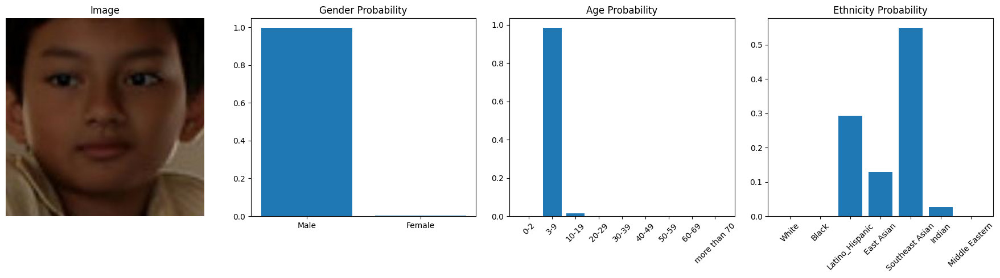

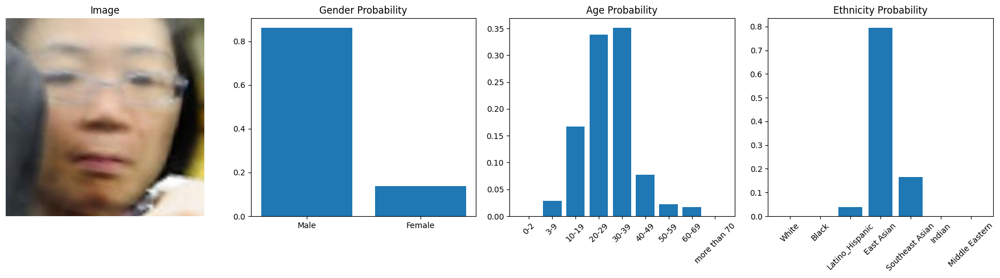

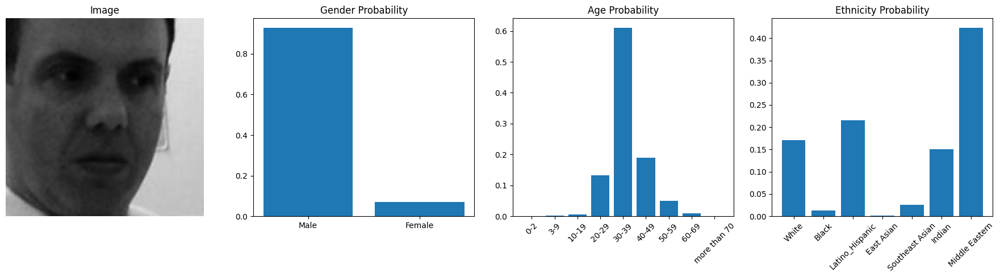

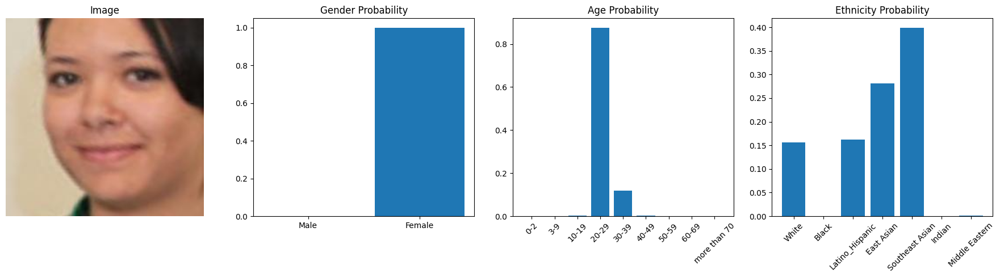

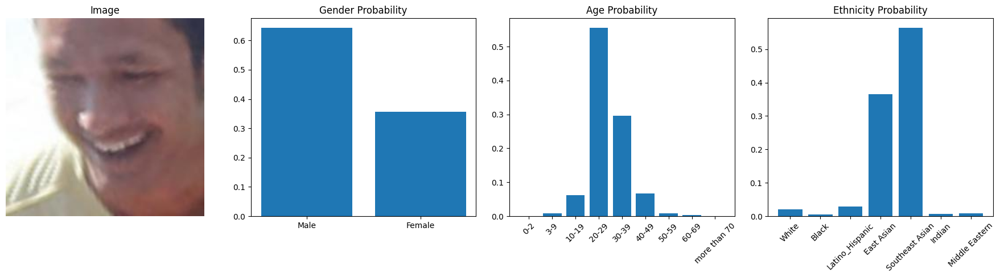

...

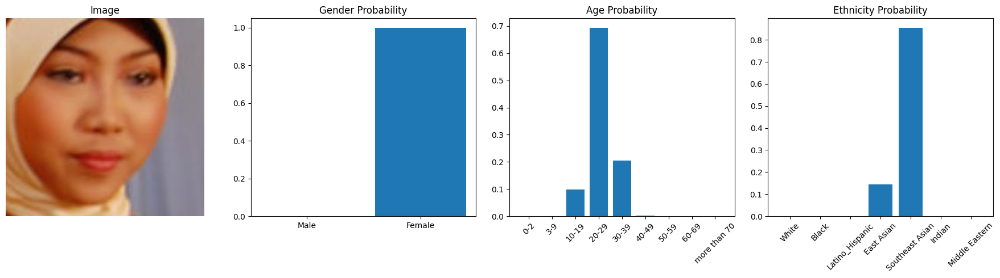

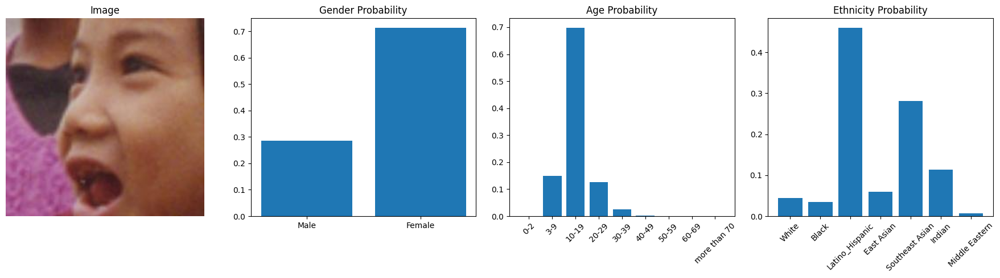

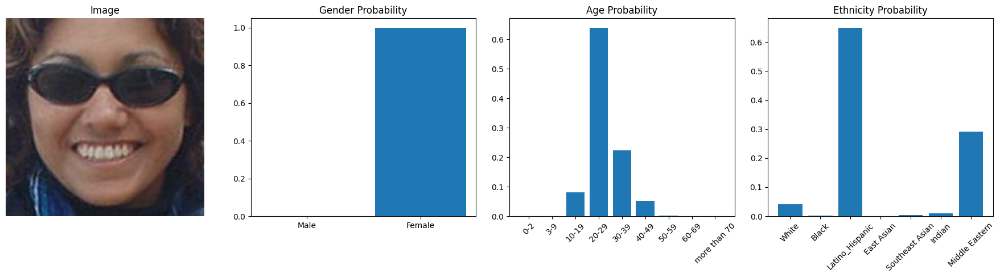

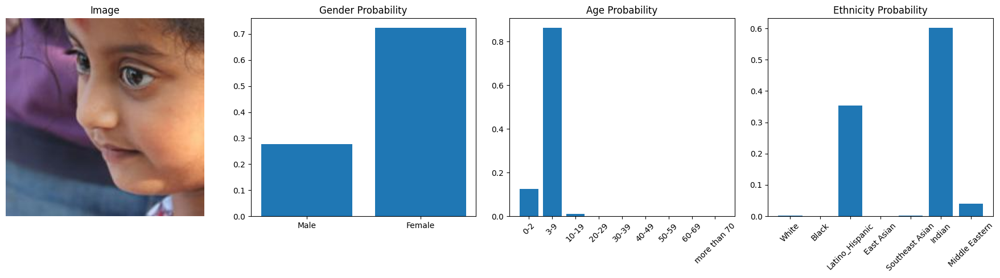

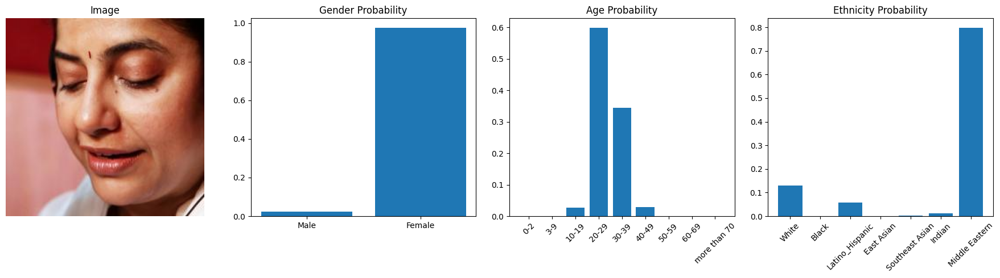

In [74]:
def show_predictions(model, val_loader, num_images=32):
    model.eval()
    with torch.no_grad():
        for images, (gender_labels, age_labels, ethnicity_labels) in val_loader:
            images = images.to(device)
            gender_output, age_output, ethnicity_output = model(images)

            _, predicted_genders = torch.max(gender_output, 1)
            _, predicted_ages = torch.max(age_output, 1)
            _, predicted_ethnicities = torch.max(ethnicity_output, 1)

            for i in range(min(num_images, len(images))):
                # get the corresponding image from the directory
                img_path = os.path.join('fairface/FairFace', val_dataset.annotations.iloc[i, 0])
                prediction_result = predict_proba(model, img_path, transform, device)
                plot_results(prediction_result)
            break

show_predictions(model, val_loader)